In [1]:
#Importing needed packages
import numpy as np
import astropy
import matplotlib.pyplot as plt
from helita.sim import rh15d
from astropy.io import fits
from matplotlib import cm
import h5py
from scipy.io import readsav
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.image import NonUniformImage

In [2]:
dpath_simulation ='/mn/stornext/d5/juanms/mpi3druns/2Druns/genohm/rain/l2d90x40rvk/sim_data_rh_it=280-369.hdf5'
input_sim = h5py.File(dpath_simulation,'r')

In [3]:
temp_juan=input_sim['temperature']
vel_juan=input_sim['velocity_z']
z    = input_sim['z']#Height (m)
x    = input_sim['x']#Spatial [m]
y    = input_sim['y']# time []

In [4]:
dpath_rh_2='/mn/stornext/d9/souvikb/Juan_Mg7/'
dpath_rh_3='/mn/stornext/d9/souvikb/Juan_Mg8/'

#data_2 = h5py.File(dpath_rh_2+'output_ray_CaII_PRD_s000.hdf5')
#data_3 = h5py.File(dpath_rh_3+'output_ray_CaII_PRD_s000.hdf5')
data_2 = h5py.File(dpath_rh_2+'output_ray_CaII_PRD_s280.hdf5','r')
data_3 = h5py.File(dpath_rh_3+'output_ray_MgII_PRD_s280.hdf5','r')

In [5]:
MgH_K_2=np.array(data_2['intensity'])
MgH_K_3=np.array(data_3['intensity'])
wave_mg = np.array(data_2['wavelength'])
indices = np.arange(len(wave_mg))[(wave_mg >279.4 ) & (wave_mg < 280.5)]

In [6]:
tau_height1 = data_2['tau_one_height']
tau_height2 = data_3['tau_one_height']

In [7]:
tau_comb = np.concatenate((tau_height1,tau_height2),axis=0)

In [8]:
inten_comb=np.concatenate((MgH_K_2,MgH_K_3),axis=0)

In [9]:
size_intensity=inten_comb.shape
size_tau = tau_comb.shape

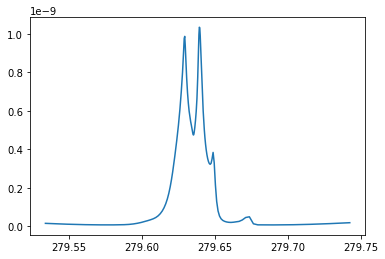

In [10]:
plt.plot(wave_mg[indices[12:152]],inten_comb[200,30,indices[12:152]])
Mg_center = 2796.3442391734520/10 #In vaccuum wavelengths

In [11]:
#Spatial convolution for each wavelength position per unit time with an FWHM of 0.33 arcsec
#Saptial sampling of the simulation is ~14 km and the spatial resolution of IRIS is ~240 km. Assuming an FWHM of 240 km, leads to a standard
# deviation that is given by 240/2.335 km ~ 102 km in the x direction in the simulation. Hence defining a Gaussian kernel with a std dev =8
# Performing a 1D spatial convolution for all x position per unit time for each wavelength position with the Astropy convolve function.
from astropy.convolution import Gaussian1DKernel,convolve
#gauss_kernel_IRIS = Gaussian1DKernel(8)
gauss_kernel = Gaussian1DKernel(2)
space_conv_MgK = np.zeros((size_intensity[0],size_intensity[1],140))
space_conv_tau_Mgk = np.zeros((size_intensity[0],size_intensity[1],140))
for time in range(size_intensity[1]):
    for wav in range(140):
        space_conv_MgK[:,time,wav] = convolve(inten_comb[:,time,indices[wav+12]],gauss_kernel,normalize_kernel=True,boundary='extend')
        space_conv_tau_Mgk[:,time,wav] = convolve(tau_comb[:,time,indices[wav+12]],gauss_kernel,normalize_kernel=True,boundary='extend')

In [12]:
#Spectral convolution per time step per unit x-position.
# First spatial smeraing and then spectral smearing as per the light path in the telescope.
#F_tran=readsav('/mn/stornext/d11/lapalma/reduc/2017/2017-05-25/CHROMIS/crispex/09:12:00/Ca_K_FP_profile2.sav')
#FP=np.array(F_tran['res2'])
#FP= FP/np.sum(FP)
#F_tran_8542=readsav('/mn/stornext/d11/lapalma/reduc/2017/2017-05-25/CHROMIS/crispex/09:12:00/Ca_8542_FP_profile.sav')
#FP_8542=np.array(F_tran_8542['tr1'])
#FP_8542= FP_8542/np.sum(FP_8542)
gauss_spectral_kernel = Gaussian1DKernel(10)
spec_conv_MgK = np.zeros((size_intensity[0],size_intensity[1],140))
spec_conv_tau_Mgk = np.zeros((size_intensity[0],size_intensity[1],140))
for time in range(size_intensity[1]):
    for x_space in range(size_intensity[0]):
        spec_conv_MgK[x_space,time,:]=convolve(space_conv_MgK[x_space,time,:],gauss_spectral_kernel,boundary='extend',normalize_kernel=True)
        spec_conv_tau_Mgk[x_space,time,:]=convolve(space_conv_tau_Mgk[x_space,time,:],gauss_spectral_kernel,boundary='extend',normalize_kernel=True)


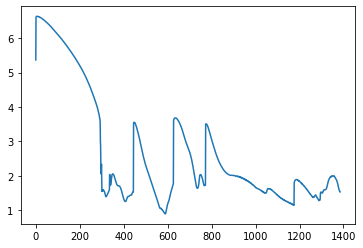

In [13]:
tau_max_Mgk = np.max(tau_comb[:,:,indices[12:140]],axis=2)
plt.plot(tau_max_Mgk[:,0]/1e6)

In [16]:
dopp_Mgk = ((wave_mg[indices[12:152]]-Mg_center)/Mg_center)*3e5

In [15]:
z1 = z[0,:]/1e6
z1.shape
x1 = x[4176:5562]/1e6
extend = (x1.min(),x1.max(),z1.max(),z1.min())
x_pos1=4865-4176
x_pos2=4980-4176

/astro/local/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: divide by zero encountered in log10
  del sys.path[0]


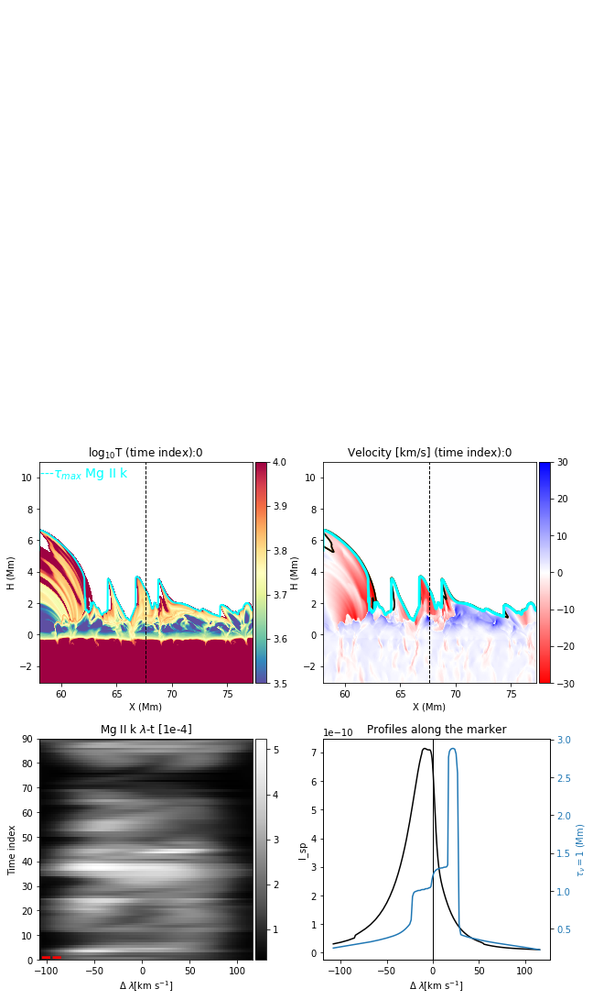

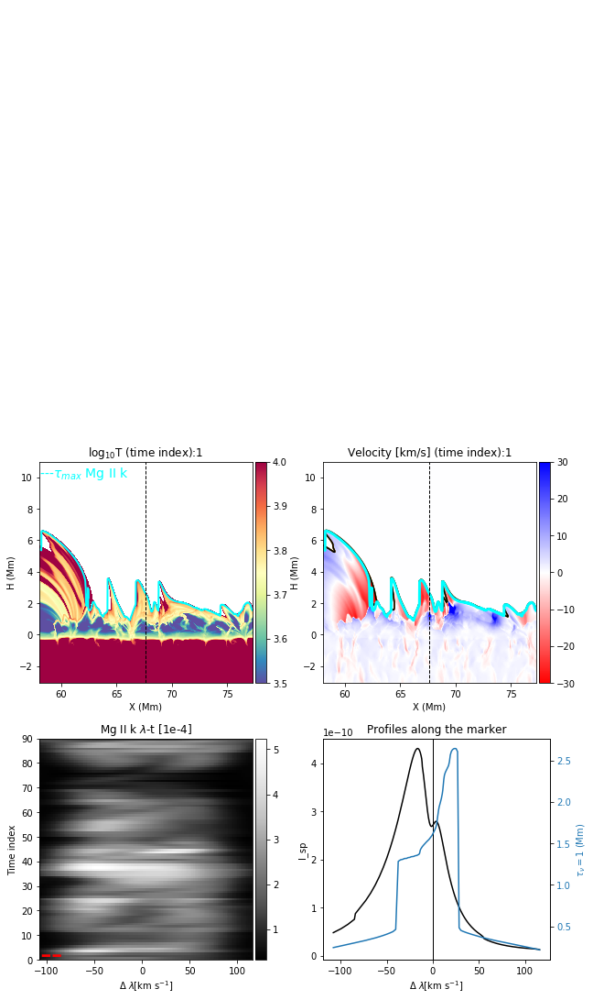

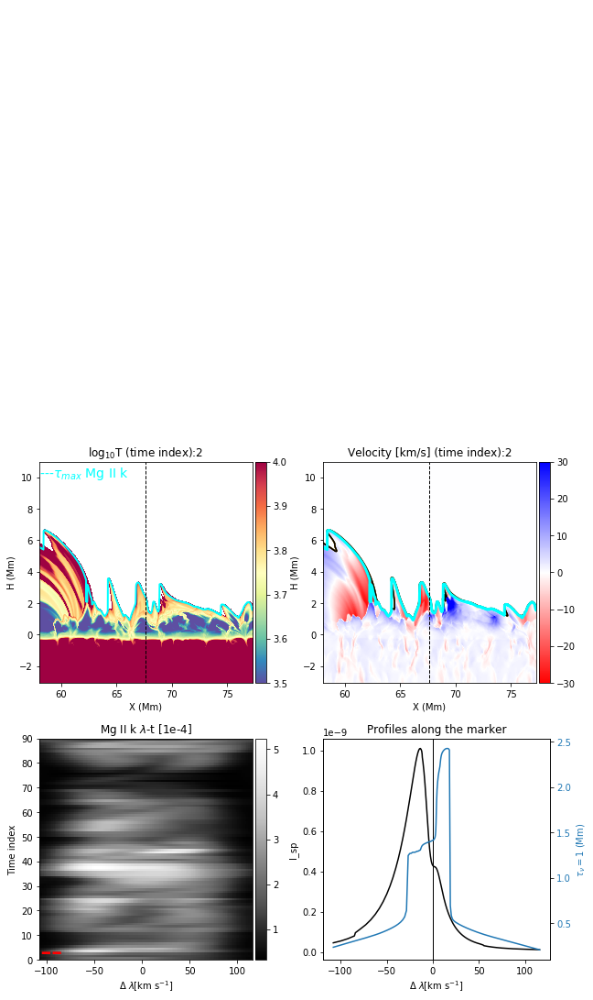

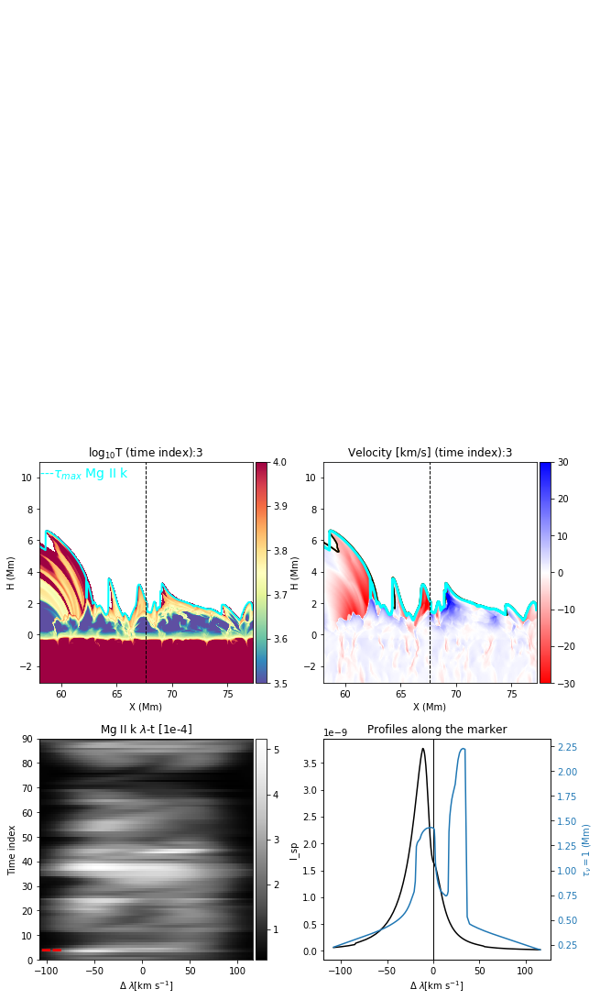

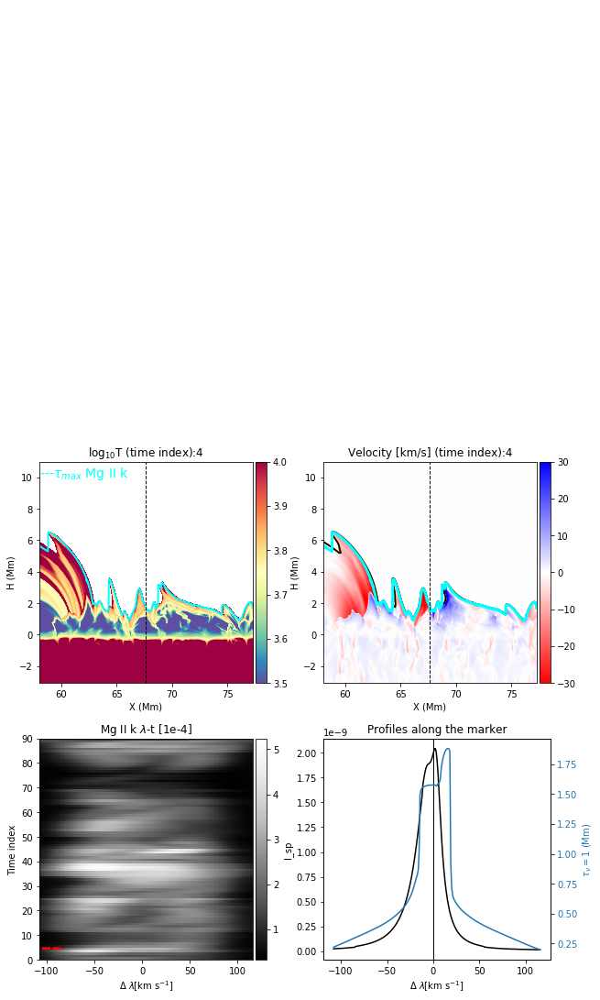

...

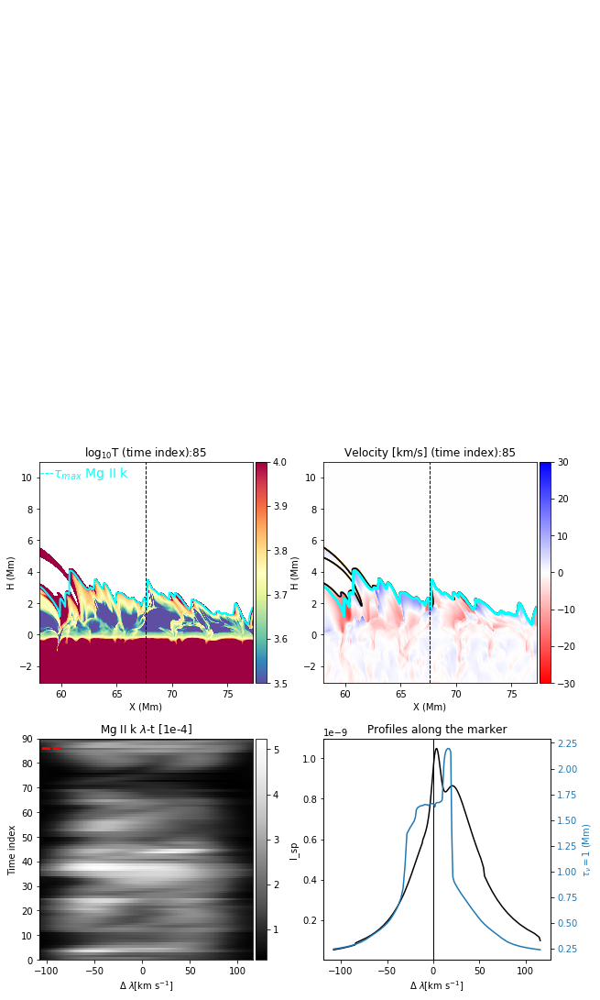

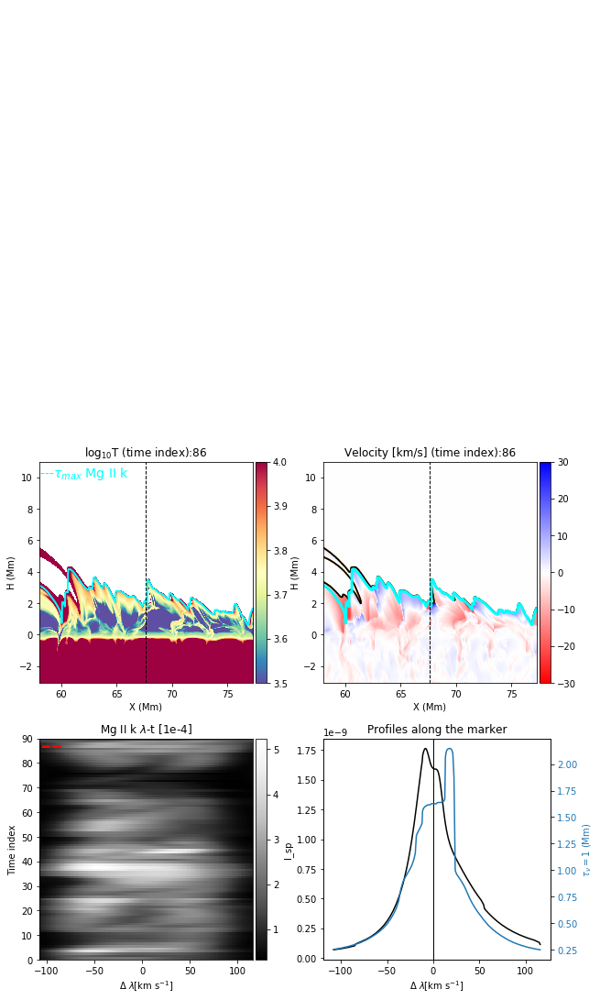

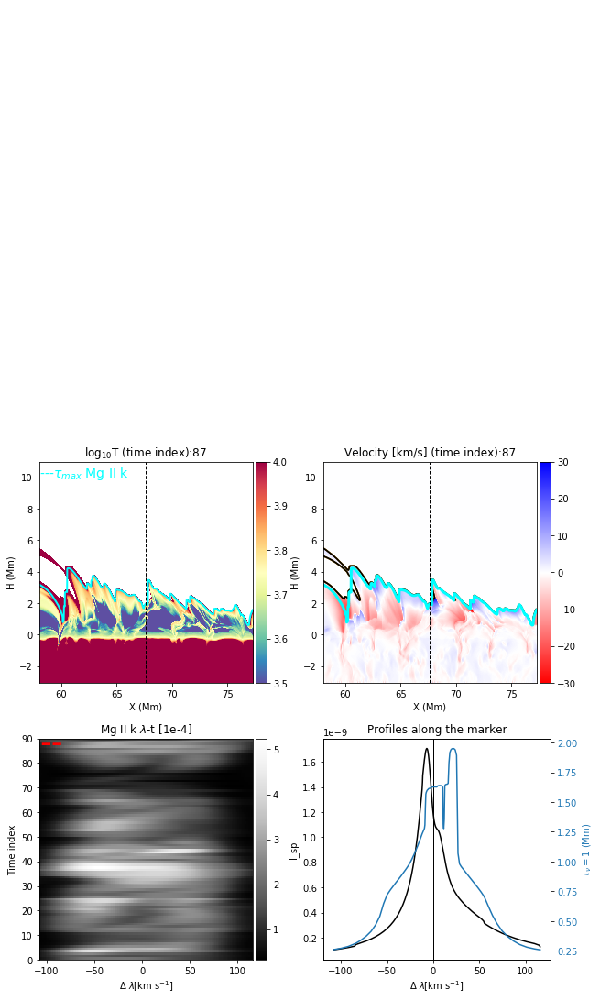

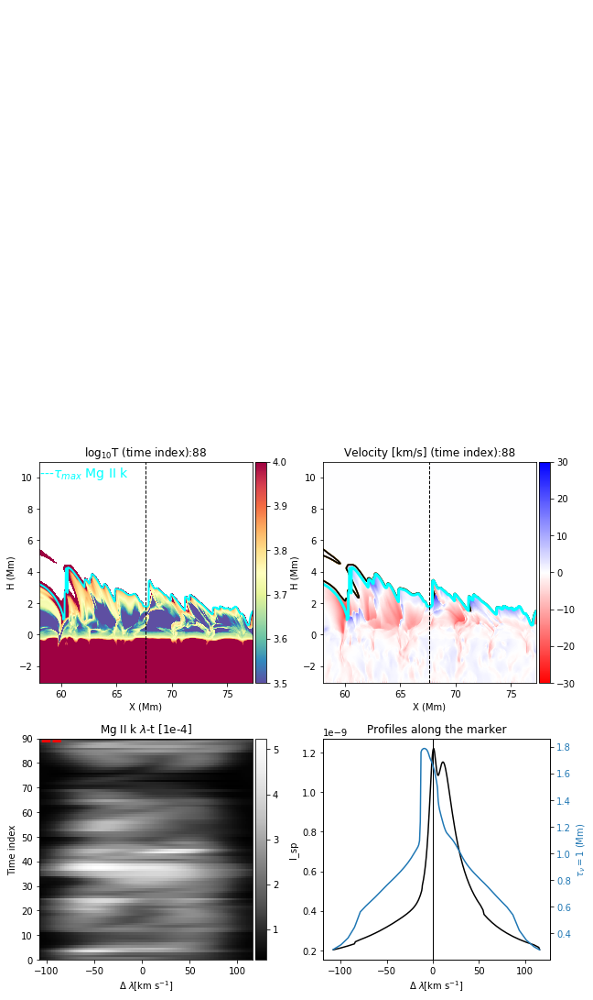

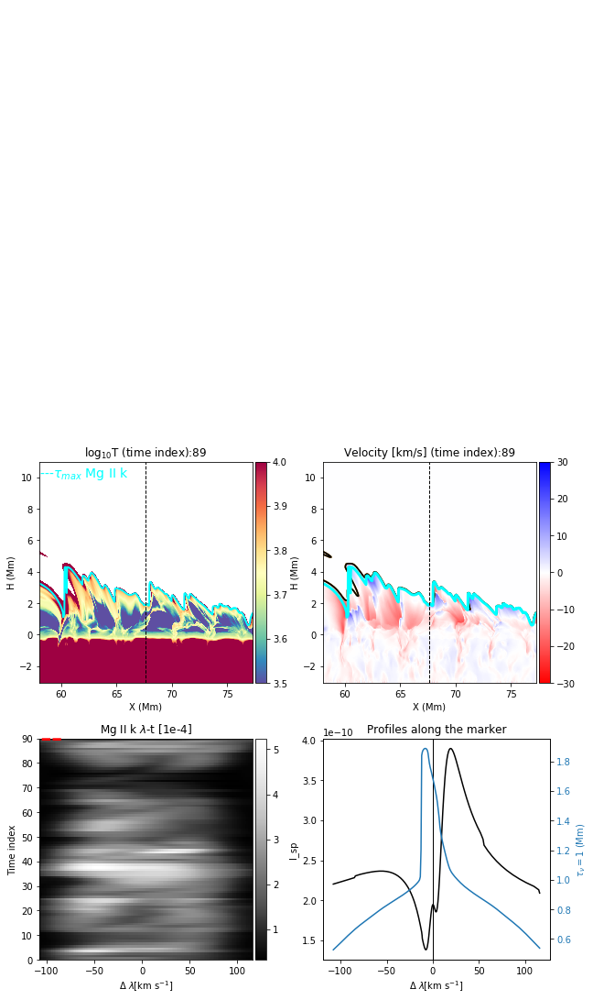

ValueError: Index (90) out of range (0-89)

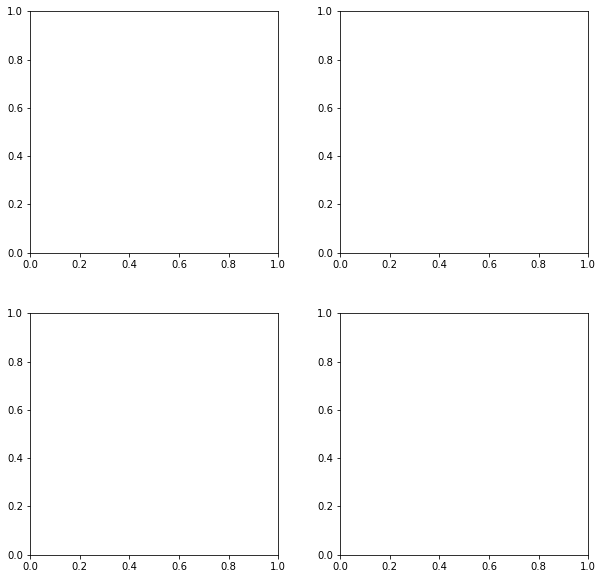

In [130]:
for time in range(91):
    fig, axs =plt.subplots(2,2,figsize=(10,10),facecolor='w', edgecolor='k')
    fig.subplots_adjust(hspace = 0.25,wspace=0.25)
    axs=axs.ravel()
    
    mask_contour=np.zeros((1386,1554))
    temp_for_contour = temp_juan[0,4176:5562,time,:]
    w_pixels = np.where(temp_for_contour <=55000)
    mask_contour[w_pixels]=1.
    
    norm1 = cm.colors.Normalize(vmax=4., vmin=3.5)
    im0 = NonUniformImage(axs[0], interpolation=None, extent=extend,cmap='Spectral_r',norm=norm1)    
    im0.set_data(x1,z1[:599:-1],np.flipud(np.squeeze(np.log10(temp_juan[0,4176:5562,time,600:].T*mask_contour[:,600:].T))))
    axs[0].set_xlim(x1.min(), x1.max())
    axs[0].set_ylim(z1.min(),11)
    axs[0].images.append(im0)    
    axs[0].plot(x[4176:5562]/1e6,tau_max_Mgk[:,time]/1e6,color='cyan',lw=2)
    axs[0].set_title(r'log$_{10}$T (time index):'+str(time))
    axs[0].axvline(x=x[x_pos1+4176]/1e6,color='black',linestyle='--',linewidth=1)
    axs[0].set_xlabel('X (Mm)')
    axs[0].set_ylabel('H (Mm)')
    divider = make_axes_locatable(axs[0])
    cax0 = divider.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im0,cax=cax0)
    axs[0].text(x[4176]/1e6,7+3,r'---$\tau_{max}$ Mg II k',color='cyan',fontsize=14)
    
    #im1=axs[1].imshow(vel_juan[0,693:2079,time,:].T/1e3*mask_contour.T,cmap='bwr_r',vmax=30,vmin=-30,aspect='auto',extent=[x[693]/1e6,x[2079]/1e6,z[0,1553]/1e6,z[0,50]/1e6])
    norm = cm.colors.Normalize(vmax=30, vmin=-30)
    im1 = NonUniformImage(axs[1], interpolation=None, extent=extend,cmap='bwr_r',norm=norm)
    im1.set_data(x1,z1[:599:-1],np.flipud(np.squeeze((vel_juan[0,4176:5562,time,600:]).T/1e3*mask_contour[:,600:].T)))  
    axs[1].set_xlim(x1.min(), x1.max())
    axs[1].set_ylim(z1.min(),11)
    axs[1].images.append(im1)       
    axs[1].plot(x[4176:5562]/1e6,tau_max_Mgk[:,time]/1e6,color='cyan',lw=3)
    axs[1].set_title('Velocity [km/s] (time index):'+str(time))
    axs[1].axvline(x=x[x_pos1+4176]/1e6,color='black',linestyle='--',linewidth=1)
    axs[1].set_xlabel('X (Mm)')
    axs[1].set_ylabel('H (Mm)')
    divider1 = make_axes_locatable(axs[1])
    cax1 = divider1.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im1,cax=cax1)
    axs[1].contour(x1,z1,mask_contour.T,levels=2,colors=['black','orange'],extent=extend,origin='upper',alpha=1.)
    
    im2=axs[2].imshow(spec_conv_MgK[x_pos1,:,:]**0.4*1e4,aspect='auto',cmap='Greys_r',origin='lower',extent=[dopp_Mgk[0],dopp_Mgk[-1],0,size_intensity[1]])
    axs[2].text(dopp_Mgk[0],time-2.5,'--',color='red',size=35)
    axs[2].set_xlabel(r'$\Delta$ $\lambda$[km s$^{-1}$]')
    axs[2].set_ylabel('Time index')
    axs[2].set_title(r'Mg II k $\lambda$-t [1e-4]')
    divider2 = make_axes_locatable(axs[2])
    cax2 = divider2.append_axes("right", size="5%", pad=0.05)
    plt.colorbar(im2,cax=cax2)
    
    axs[3].plot(dopp_Mgk,(spec_conv_MgK[x_pos1,time,:]),color='black')
    axs[3].set_xlabel(r'$\Delta$ $\lambda$[km s$^{-1}$]')
    axs[3].set_ylabel('I_sp')
    axs[3].set_title('Profiles along the marker')
    axs_r1 = axs[3].twinx()
    color = 'tab:blue'
    axs_r1.set_ylabel(r'$\tau_{\nu}=1$ (Mm)', color=color) 
    axs_r1.plot(dopp_Mgk,(tau_comb[x_pos1,time,indices[12:152]])/1e6,color=color)
    axs_r1.tick_params(axis='y', labelcolor=color)
    axs[3].axvline(0,color='black',linestyle='-',linewidth=1)
    plt.savefig('/mn/stornext/u3/souvikb/paper4_images/Juan_simulation/wave_time_juan_Mg_k'+str(time)+'.png',dpi=600,orientation='landscape')
    plt.show()

/astro/local/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:16: RuntimeWarning: divide by zero encountered in log10
  app.launch_new_instance()


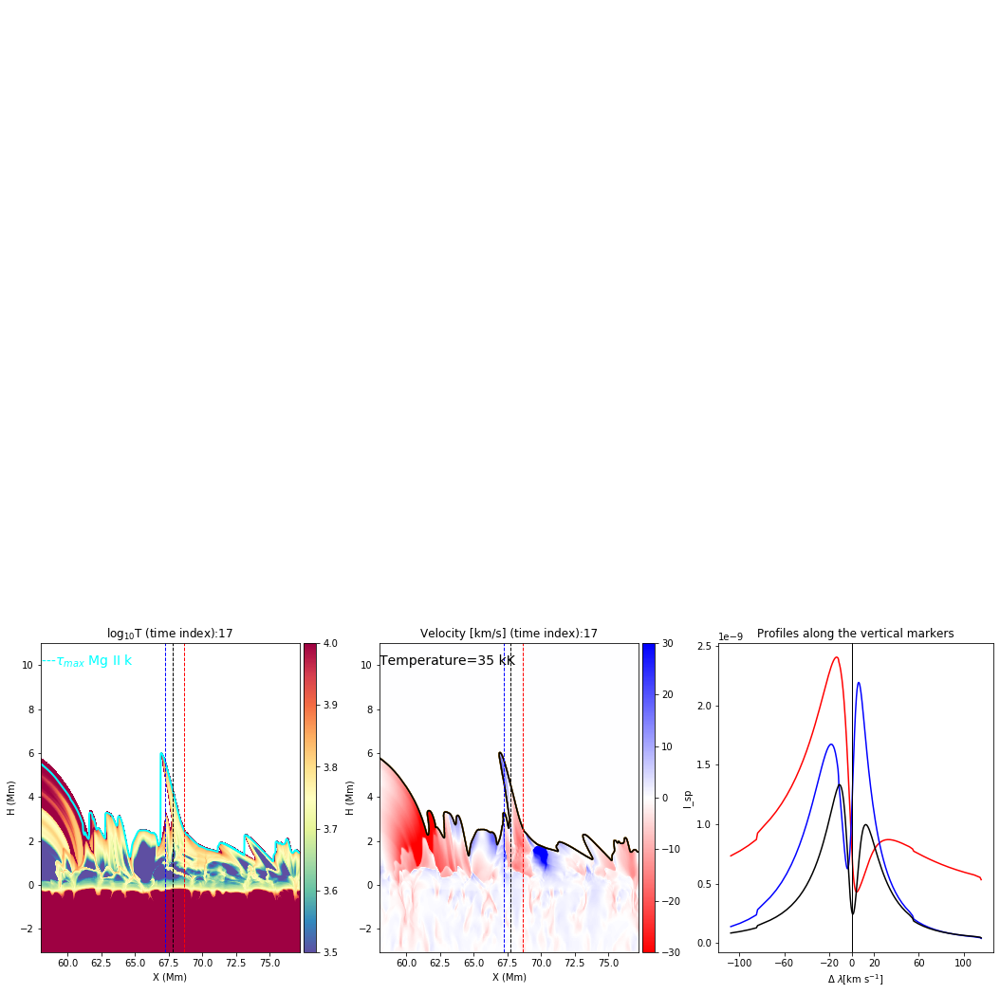

In [158]:
# For the profiles along a spicule for a particular snapshot
x_lam_ticks =[-100,-60,-20,0,20,60,100]
time=17
fig, axs =plt.subplots(1,3,figsize=(18,6),facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace = 0.25,wspace=0.23)
axs=axs.ravel()

mask_contour=np.zeros((1386,1554))
temp_for_contour = temp_juan[0,4176:5562,time,:]
w_pixels = np.where(temp_for_contour <=35000)
mask_contour[w_pixels]=1.

#axs[0].imshow(CaH_K[310,:,20:75]**0.4,aspect='auto',cmap='Greys_r',origin='lower',extent=[wave[indices][20],wave[indices][70],0,40])
norm1 = cm.colors.Normalize(vmax=4, vmin=3.5)
im0 = NonUniformImage(axs[0], interpolation=None, extent=extend,cmap='Spectral_r',norm=norm1)
im0.set_data(x1,z1[:599:-1],np.flipud(np.squeeze(np.log10(temp_juan[0,4176:5562,time,600:].T*mask_contour[:,600:].T))))
axs[0].set_xlim(x1.min(), x1.max())
axs[0].set_ylim(z1.min(),11)
axs[0].images.append(im0)    
axs[0].plot(x[4176:5562]/1e6,tau_max_Mgk[:,time]/1e6,color='cyan',lw=2)
axs[0].set_title(r'log$_{10}$T (time index):'+str(time))
axs[0].axvline(x=x[4940]/1e6,color='red',linestyle='--',linewidth=1)
axs[0].axvline(x=x[4840]/1e6,color='blue',linestyle='--',linewidth=1)
axs[0].axvline(x=x[4880]/1e6,color='black',linestyle='--',linewidth=1)
axs[0].set_xlabel('X (Mm)')
axs[0].set_ylabel('H (Mm)')
divider = make_axes_locatable(axs[0])
cax0 = divider.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im0,cax=cax0)
axs[0].text(x[4176]/1e6,7+3,r'---$\tau_{max}$ Mg II k',color='cyan',fontsize=14)


norm = cm.colors.Normalize(vmax=30, vmin=-30)
im1 = NonUniformImage(axs[1], interpolation=None, extent=extend,cmap='bwr_r',norm=norm)
im1.set_data(x1,z1[:599:-1],np.flipud(np.squeeze((vel_juan[0,4176:5562,time,600:]).T/1e3*mask_contour[:,600:].T)))  
axs[1].set_xlim(x1.min(), x1.max())
axs[1].set_ylim(z1.min(),11)
axs[1].images.append(im1)       
#axs[1].plot(x[4176:5562]/1e6,tau_max_8542[:,time]/1e6,color='cyan',lw=2)
#axs[1].plot(x[4176:5562]/1e6,tau_max_cak[:,time]/1e6,color='orange',lw=3)
axs[1].set_title('Velocity [km/s] (time index):'+str(time))
axs[1].axvline(x=x[4940]/1e6,color='red',linestyle='--',linewidth=1)
axs[1].axvline(x=x[4840]/1e6,color='blue',linestyle='--',linewidth=1)
axs[1].axvline(x=x[4875]/1e6,color='black',linestyle='--',linewidth=1)
axs[1].set_xlabel('X (Mm)')
axs[1].set_ylabel('H (Mm)')
divider1 = make_axes_locatable(axs[1])
cax1 = divider1.append_axes("right", size="5%", pad=0.05)
plt.colorbar(im1,cax=cax1)
axs[1].contour(x1,z1,mask_contour.T,levels=2,colors=['black','orange'],extent=extend,origin='upper',alpha=1.)
axs[1].text(x[4176]/1e6,7+3,r'Temperature=35 kK',color='black',fontsize=14)

axs[2].plot(dopp_Mgk,(spec_conv_MgK[4940-4176,time,:]),color='red')
axs[2].plot(dopp_Mgk,0.9*(spec_conv_MgK[4840-4176,time,:]),color='blue')
#axs[3].plot(dopp_cak[0:53],(CaH_K_0[370,time,indices[20:73]]),color='magenta')
axs[2].plot(dopp_Mgk,(spec_conv_MgK[4875-4176,time,:]),color='black')
#axs[3].plot(dopp_cak[0:53],(CaH_K_0[400,time,indices[20:73]]),color='cyan')
axs[2].axvline(0,color='black',linestyle='-',linewidth=1)
axs[2].set_xlabel(r'$\Delta$ $\lambda$[km s$^{-1}$]')
axs[2].set_ylabel('I_sp')
axs[2].set_title('Profiles along the vertical markers')
axs[2].set_xticks(x_lam_ticks)
plt.savefig('/mn/stornext/u3/souvikb/paper4_images/Juan_simulation/Mg_K_progression'+str(time)+'.png',dpi=600,orientation='landscape')
plt.show()


In [85]:
#Define functions in the beginning of the programme
def radiation_temperature(lambda_ref, I_sp):
    """Compute the radiation/brightness temperature 
    from specific intensity
    lambda_ref: wavelength of interest in SI units
    I_sp: Specific intensity in SI units"""
    h =6.62607015e-34 #J-s
    c = 3.0e8 #m/s
    k_b = 1.380649e-23 # J/K
    N_r = (h*c)/(lambda_ref*k_b)
    vary = (2*h*c**2)/(lambda_ref**5)
    D_r = np.log((vary/(I_sp*c/lambda_ref**2)+1)) #np.log is equivalent to ln
    T_rad = N_r/D_r
    return T_rad

In [100]:
#======== Converting specific intensity to brightness temperature ======##
T_brightness = np.zeros((140))
for wl in range(140):
    T_brightness[wl] = radiation_temperature(lambda_ref=wave_mg[indices[12+wl]]*1e-9, I_sp=np.mean(spec_conv_MgK[4865-4176:4865-4174,time1,wl],axis=0))

In [103]:
#======== Converting specific intensity to brightness temperature ======##
T_brightness_DRRE = np.zeros((140))
for wl in range(140):
    T_brightness_DRRE[wl] = radiation_temperature(lambda_ref=wave_mg[indices[12+wl]]*1e-9, I_sp=np.mean(spec_conv_MgK[4865-4176:4865-4174,time2,wl],axis=0))

In [117]:
##===== Reading brightness temperature for Ca K=======##
T_rad_Ca = h5py.File('/mn/stornext/u3/souvikb/UiO_codes/Paper_5_codes/T_bright_Ca_new','r')
T_rad_up = np.array(T_rad_Ca['T_bright_upflow'])
T_rad_downflow = np.array(T_rad_Ca['T_bright_downflow'])
dopp_cak = np.array(T_rad_Ca['lambda_scale'])

In [116]:
T_rad_Ca.keys()

<KeysViewHDF5 ['T_bright_downflow', 'T_bright_upflow', 'lambda_scale']>

In [108]:
pwd

'/mn/stornext/u3/souvikb/UiO_codes/Paper_4_codes/Jupyter_Notebooks'

/astro/local/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:18: RuntimeWarning: divide by zero encountered in log10
/astro/local/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:144: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "pad_innches" which is no longer supported as of 3.3 and will become an error two minor releases later


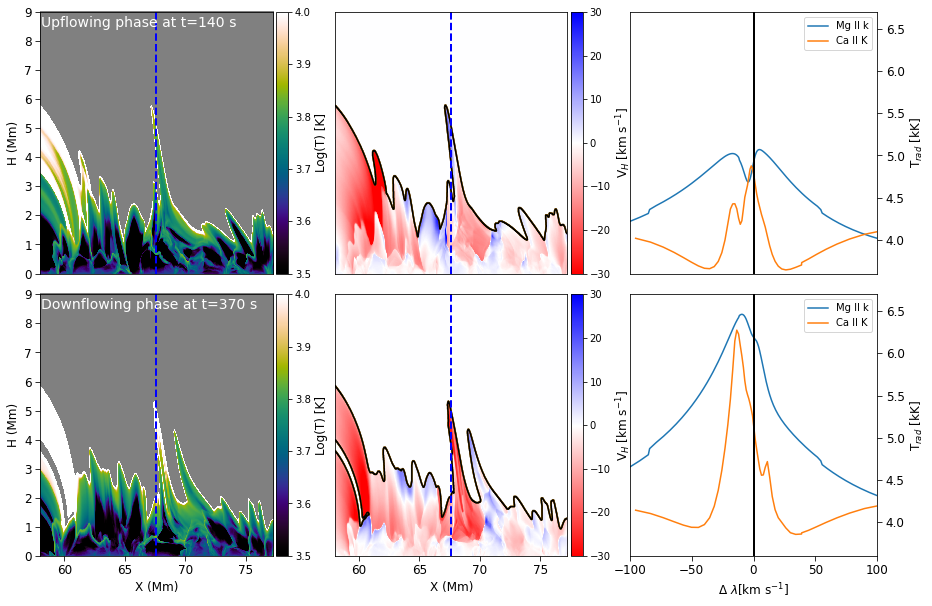

In [130]:
# For the profiles along a spicule for a particular snapshot
import cmasher as cmr
time1=14
time2 = 37

fig, axs =plt.subplots(2,3,figsize=(15,10),facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace = 0.08,wspace=0.19)
axs=axs.ravel()

mask_contour=np.zeros((1386,1554))
temp_for_contour = temp_juan[0,4176:5562,time1,:]
w_pixels = np.where(temp_for_contour <=35000)
mask_contour[w_pixels]=1.

#axs[0].imshow(CaH_K[310,:,20:75]**0.4,aspect='auto',cmap='Greys_r',origin='lower',extent=[wave[indices][20],wave[indices][70],0,40])
norm1 = cm.colors.Normalize(vmax=4, vmin=3.5)
im0 = NonUniformImage(axs[0], interpolation=None, extent=[x1.min(),x1.max(),0,9],cmap=cmr.rainforest,norm=norm1)
im0.set_data(x1,z1[:649:-1],np.flipud(np.squeeze(np.log10(temp_juan[0,4176:5562,time1,650:].T*mask_contour[:,650:].T))))
axs[0].set_xlim(x1.min(), x1.max())
axs[0].set_ylim(0,9)
axs[0].images.append(im0)    
#axs[0].plot(x[4176:5562]/1e6,tau_max_8542[:,time]/1e6,color='cyan',lw=2)
#axs[0].plot(x[4176:5562]/1e6,tau_max_cak[:,time]/1e6,color='magenta',lw=2)
#axs[0].set_title(r'log$_{10}$T (time index):'+str(time1))
#axs[0].axvline(x=x[4940]/1e6,color='red',linestyle='--',linewidth=1)
axs[0].axvline(x=x[4865]/1e6,color='blue',linestyle='--',linewidth=2)
#axs[0].axvline(x=x[4880]/1e6,color='black',linestyle='--',linewidth=1)
axs[0].set_xticks([])
axs[0].set_ylabel('H (Mm)',fontsize=12)
divider = make_axes_locatable(axs[0])
cax0 = divider.append_axes("right", size="5%", pad=0.05)
cbar=plt.colorbar(im0,cax=cax0)
cbar.set_label(r'Log(T) [K]',size=12)
#axs[0].text(x[4176]/1e6,6+3,r'---$\tau_{max}$ Ca II K',color='orange',fontsize=14)
#axs[0].text(x[4176]/1e6,7+3,r'---$\tau_{max}$ Ca II 8542',color='cyan',fontsize=14)
axs[0].text(x[4180]/1e6,8.5,'Upflowing phase at t=140 s',fontsize=14,color='white')
axs[0].tick_params(direction='out', length=5,color='black',labelsize=12)

norm = cm.colors.Normalize(vmax=30, vmin=-30)
im1 = NonUniformImage(axs[1], interpolation=None, extent=[x1.min(),x1.max(),0,9],cmap='bwr_r',norm=norm)
im1.set_data(x1,z1[:649:-1],np.flipud(np.squeeze((vel_juan[0,4176:5562,time1,650:]).T/1e3*mask_contour[:,650:].T)))  
axs[1].set_xlim(x1.min(), x1.max())
axs[1].set_ylim(0,9)
axs[1].images.append(im1)       
#axs[1].plot(x[4176:5562]/1e6,tau_max_8542[:,time]/1e6,color='cyan',lw=2)
#axs[1].plot(x[4176:5562]/1e6,tau_max_cak[:,time]/1e6,color='orange',lw=3)
#axs[1].axvline(x=x[4940]/1e6,color='red',linestyle='--',linewidth=1)
axs[1].axvline(x=x[4865]/1e6,color='blue',linestyle='--',linewidth=2)
#axs[1].axvline(x=x[4880]/1e6,color='black',linestyle='--',linewidth=1)
axs[1].set_xticks([])
axs[1].set_yticks([])
divider1 = make_axes_locatable(axs[1])
cax1 = divider1.append_axes("right", size="5%", pad=0.05)
cbar=plt.colorbar(im1,cax=cax1)
cbar.set_label(r'V$_{H}$ [km s$^{-1}$]',size=12)
axs[1].contour(x1,z1,mask_contour.T,levels=2,colors=['black','orange'],extent=[x1.min(),x1.max(),0,9],origin='upper',alpha=1.)
#axs[1].text(x[4176]/1e6,7+3,r'Temperature=35 kK',color='black',fontsize=14)
axs[1].tick_params(direction='out', length=5,color='black',labelsize=12)

#axs[2].plot(dopp_cak[0:53],np.mean(spec_conv_CaH_K[4942-4176:4942-4176+2,time,0:53],axis=0),color='red')
axs[2].plot(dopp_Mgk,T_brightness/1e3,label='Mg II k')
axs[2].plot(dopp_cak,T_rad_up/1e3,label='Ca II K')
#axs[3].plot(dopp_cak[0:53],(CaH_K_0[370,time,indices[20:73]]),color='magenta')
#axs[2].plot(dopp_cak[0:53],np.mean(spec_conv_CaH_K[4880-4176:4880-4174,time,0:53],axis=0),color='black')
#axs[3].plot(dopp_cak[0:53],(CaH_K_0[400,time,indices[20:73]]),color='cyan')
axs[2].yaxis.set_label_position("right")
axs[2].yaxis.tick_right()
axs[2].axvline(0,color='black',linestyle='-',linewidth=2)
#axs[2].set_xlabel(r'$\Delta$ $\lambda$[km s$^{-1}$]')
axs[2].set_ylabel(r'T$_{rad}$ [kK]',fontsize=12)
#axs[2].set_title('Mg II k')
axs[2].set_xticks([])
axs[2].tick_params(direction='out', length=5,color='black',labelsize=12)
axs[2].set_ylim([3.6,6.7])
axs[2].set_xlim([-100,100])
axs[2].legend(loc='best')

mask_contour1=np.zeros((1386,1554))
temp_for_contour1 = temp_juan[0,4176:5562,time2,:]
w_pixels = np.where(temp_for_contour1 <=35000)
mask_contour1[w_pixels]=1.

temp_masked = np.ma.masked_where(np.log10(temp_juan[0,4176:5562,time2,650:].T) >= 4.5, np.log10(temp_juan[0,4176:5562,time2,650:].T))
cmap1 = cmr.rainforest
cmap1.set_bad(color='gray')
norm2 = cm.colors.Normalize(vmax=4, vmin=3.5)
im3 = NonUniformImage(axs[3], interpolation=None, extent=[x1.min(),x1.max(),0,9],cmap=cmap1,norm=norm2)
im3.set_data(x1,z1[:649:-1],np.flipud(np.squeeze(temp_masked)))
axs[3].set_xlim(x1.min(), x1.max())
axs[3].set_ylim(0,9)
axs[3].images.append(im3)    
#axs[0].plot(x[4176:5562]/1e6,tau_max_8542[:,time]/1e6,color='cyan',lw=2)
#axs[0].plot(x[4176:5562]/1e6,tau_max_cak[:,time]/1e6,color='magenta',lw=2)
#axs[3].set_title(r'log$_{10}$T (time index):'+str(time2))
#axs[0].axvline(x=x[4940]/1e6,color='red',linestyle='--',linewidth=1)
axs[3].axvline(x=x[4865]/1e6,color='blue',linestyle='--',linewidth=2)
#axs[3].axvline(x=x[4880]/1e6,color='black',linestyle='--',linewidth=1)
axs[3].set_xlabel('X (Mm)',fontsize=12)
axs[3].set_ylabel('H (Mm)',fontsize=12)
divider = make_axes_locatable(axs[3])
cax3 = divider.append_axes("right", size="5%", pad=0.05)
cbar=plt.colorbar(im3,cax=cax3)
cbar.set_label(r'Log(T) [K]',size=12)
# #axs[0].text(x[4176]/1e6,6+3,r'---$\tau_{max}$ Ca II K',color='orange',fontsize=14)
#axs[0].text(x[4176]/1e6,7+3,r'---$\tau_{max}$ Ca II 8542',color='cyan',fontsize=14)
axs[3].text(x[4180]/1e6,8.5,'Downflowing phase at t=370 s',fontsize=14,color='white')
axs[3].tick_params(direction='out', length=5,color='black',labelsize=12)

norm3 = cm.colors.Normalize(vmax=30, vmin=-30)
im4 = NonUniformImage(axs[4], interpolation=None, extent=[x1.min(),x1.max(),0,9],cmap='bwr_r',norm=norm3)
im4.set_data(x1,z1[:649:-1],np.flipud(np.squeeze((vel_juan[0,4176:5562,time2,650:]).T/1e3*mask_contour1[:,650:].T)))  
axs[4].set_xlim(x1.min(), x1.max())
axs[4].set_ylim(0,9)
axs[4].images.append(im4)       
#axs[1].plot(x[4176:5562]/1e6,tau_max_8542[:,time]/1e6,color='cyan',lw=2)
#axs[1].plot(x[4176:5562]/1e6,tau_max_cak[:,time]/1e6,color='orange',lw=3)
#axs[4].set_title('Velocity [km/s] (time index):'+str(time2))
#axs[1].axvline(x=x[4940]/1e6,color='red',linestyle='--',linewidth=1)
axs[4].axvline(x=x[4865]/1e6,color='blue',linestyle='--',linewidth=2)
#axs[4].axvline(x=x[4880]/1e6,color='black',linestyle='--',linewidth=1)
axs[4].set_xlabel('X (Mm)',fontsize=12)
axs[4].set_yticks([])
divider1 = make_axes_locatable(axs[4])
cax1 = divider1.append_axes("right", size="5%", pad=0.05)
cbar=plt.colorbar(im1,cax=cax1)
cbar.set_label(r'V$_{H}$ [km s$^{-1}$]',size=12)
axs[4].contour(x1,z1,mask_contour1.T,levels=2,colors=['black','orange'],extent=[x1.min(),x1.max(),0,9],origin='upper',alpha=1.)
#axs[4].text(x[4176]/1e6,7+3,r'Temperature=35 kK',color='black',fontsize=14)
axs[4].tick_params(direction='out', length=5,color='black',labelsize=12)

axs[5].plot(dopp_Mgk,T_brightness_DRRE/1e3,label='Mg II k')
axs[5].plot(dopp_cak,T_rad_downflow/1e3,label='Ca II K')
#axs[3].plot(dopp_cak[0:53],(CaH_K_0[400,time,indices[20:73]]),color='cyan')
axs[5].axvline(0,color='black',linestyle='-',linewidth=2)
axs[5].set_xlabel(r'$\Delta$ $\lambda$[km s$^{-1}$]',fontsize=12)
axs[5].set_ylabel(r'T$_{rad}$ [kK]',fontsize=12)
#axs[5].set_title('Mg II K')
axs[5].yaxis.set_label_position("right")
axs[5].yaxis.tick_right()
axs[5].tick_params(direction='out', length=5,color='black',labelsize=12)
axs[5].set_ylim([3.6,6.7])
axs[5].set_xlim([-100,100])
axs[5].legend(loc='best')
plt.savefig('/mn/stornext/d9/souvikb/paper5_results/RBE_vs_DRRE_heating_Mg_Ca.pdf',format='pdf',dpi=400,orientation='landscape',bbox_inches = 'tight',pad_innches=0.1)
#plt.show()

